Importing dependencies

In [1]:
import traj_dist.distance as tdist #to compile distances
import pyclustering as cl #to cluster the distances
from pyclustering.cluster import cluster_visualizer
from pyclustering.cluster.gmeans import gmeans
from pyclustering.utils import read_sample
from pyclustering.samples.definitions import FCPS_SAMPLES
import traja as tr #to work with trajectory data
import pandas as pd #to read csv file
import itertools #to compare all trajectories
import numpy as np
from matplotlib import pyplot as plt
import csv
from traja.frame import TrajaCollection #to use all trajectories at once
import seaborn as sns
import geopandas
import geoplot
import random
from copy import deepcopy

import numpy as np
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from scipy import interpolate

Reading the necessary data from files

In [2]:
X = []
file_in = open('listfile.txt', 'r')
bird_Data = pd.read_csv("bird_Data.csv")
i = 0
for y in file_in.read().splitlines():
    X.append(float(y))
    i = i + float(y)
dataframe = pd.read_csv("GWFG/GPS_GWFG.csv")
trajectory_names = dataframe[["AnimalID"]].values.ravel()
unique_trajectory_values =  pd.unique(trajectory_names)

Putting data of SSPD distances inside an organized CSV file

In [3]:
trajectory1 = X[:80]
distance_list = {'traj':[],'traj_compared':[], 'distance':[]}
i = 1
while i<6401:
    if(i%80 == 0):
        distance_list['traj'].append(unique_trajectory_values[(i//80)-1])
        distance_list['traj_compared'].append(unique_trajectory_values[79])
        distance_list['distance'].append(X[i-1])
    else:
        distance_list['traj'].append(unique_trajectory_values[(i//80)])
        distance_list['traj_compared'].append(unique_trajectory_values[(i%80)-1])
        distance_list['distance'].append(X[i-1])
    i = i+1
df = pd.DataFrame(data=distance_list)
#df.to_csv('distance_list.csv') #Write to csv file

Setting boundaries for asia

In [4]:
world = geopandas.read_file(
    geopandas.datasets.get_path('naturalearth_lowres')
)
asia = world.cx[90:, 45:]#('continent == "Asia"')
dataframe = pd.read_csv("re_sampled_bird_data.csv")
dataframe = dataframe.rename(columns={"Longitude": "x", "Latitude": "y", "Timestamp": "time", "TagID": "id"})
trj = tr.TrajaDataFrame(dataframe)
trajectories = TrajaCollection(trj, id_col="id")
trajectories_xy = trajectories[['AnimalID','x','y']]
single_tr = trajectories_xy.groupby("AnimalID",group_keys=False)#Needed to have individual trajectories
single_trj = np.asarray(single_tr)#needed to use traj_dist
single_trj = single_trj[:,[1]]
print(single_trj)

[[TrajaCollection:
           AnimalID           x          y
176092  D3391(GWFG)  116.234631  29.155719
176093  D3391(GWFG)  116.234707  29.155799
176094  D3391(GWFG)  116.233729  29.155736
176095  D3391(GWFG)  116.204293  29.106823
176096  D3391(GWFG)  116.238921  29.118821
...             ...         ...        ...
177455  D3391(GWFG)  116.299555  29.027315
177456  D3391(GWFG)  116.299593  29.027276
177457  D3391(GWFG)  116.299500  29.027287
177458  D3391(GWFG)  116.299627  29.027260
177459  D3391(GWFG)  116.299538  29.027231

[1368 rows x 3 columns]]
 [TrajaCollection:
           AnimalID           x          y
166987  D3414(GWFG)  116.375920  28.932818
166988  D3414(GWFG)  116.375942  28.932788
166989  D3414(GWFG)  116.375892  28.932730
166990  D3414(GWFG)  116.375510  28.932354
166991  D3414(GWFG)  116.370080  28.924921
...             ...         ...        ...
168335  D3414(GWFG)  116.309356  29.017558
168336  D3414(GWFG)  116.309316  29.017582
168337  D3414(GWFG)  116.309337  

Make from all trajectories a Linestring to put onto a plot

80
[[116.2346306, 29.1557193], [116.2347071, 29.1557988], [116.2337288, 29.1557365], [116.2042928, 29.106823], [116.23892109999998, 29.118821], [116.2130796, 29.1545945], [116.20623390000002, 29.1255545], [116.2062715, 29.1255468], [116.2062267, 29.1255289], [116.2109182, 29.133725899999995], [116.2126729, 29.1302933], [116.2130073, 29.1292599], [116.2211078, 29.1463585], [116.2213488, 29.1458157], [116.2222844, 29.1451277], [116.218945, 29.1504692], [116.2189293, 29.15009910000001], [116.2087551, 29.1223268], [116.2081221, 29.1214728], [116.2083507, 29.1213798], [116.2083496, 29.121335], [116.2083553, 29.1213332], [116.2083645, 29.121330100000005], [116.2192403, 29.1451518], [116.2176214, 29.1421608], [116.218295, 29.145787], [116.2184456, 29.1455118], [116.2193266, 29.1450142], [116.1962376, 29.1351964], [116.1699325, 29.1355504], [116.1703132, 29.1355715], [116.17062620000002, 29.1352442], [116.1706729, 29.1351254], [116.2097149, 29.1365103], [116.211378, 29.136876], [116.2206976, 2

<AxesSubplot:>

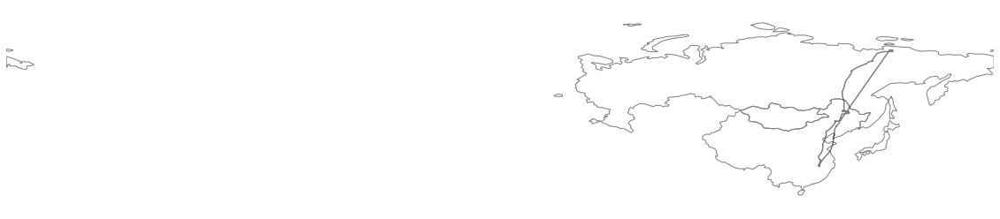

In [5]:
longitudes = []
latitudes = []
linestrings = []
print(len(single_trj))
for x in single_trj:
    traj_a = x[0]
    longitudes = traj_a['y']
    latitudes = traj_a['x']
    long_lang =  traj_a = traj_a[['y','x']]
    p = len(long_lang)
    i = 0
    linestring = []
    while i < p:
        lst = [long_lang['x'].iloc[i],long_lang['y'].iloc[i]]
        linestring.append(lst)
        i = i+1
    linestrings.append(linestring)
from shapely.geometry import Polygon, LineString
print(linestrings[0])
line1 = LineString(linestrings[0])
line_gdf = geopandas.GeoDataFrame(geometry=[line1])
ax = line_gdf.plot(figsize=(20, 15), alpha=0.5, edgecolor='k')
geoplot.polyplot(asia, edgecolor='gray', ax=ax)

In [6]:
linestrings_copy = []
traj = []
for traject in linestrings:
    for value in traject:
        if(value[0] > 100):
            traj.append(value)
    linestrings_copy.append(traj)
    traj = []

Put all linestrings onto asia map

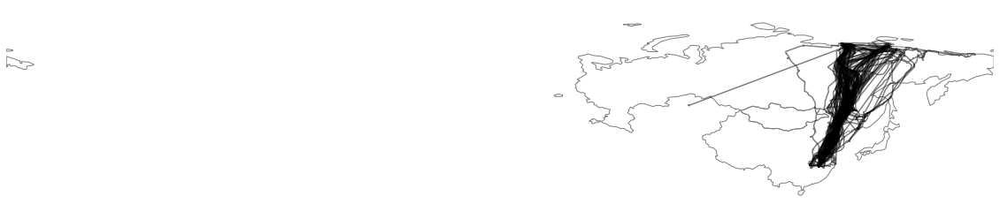

In [7]:
from shapely.geometry import MultiLineString, LineString, Point, MultiPoint
line1 = MultiLineString(linestrings)
linecombi = [[[116,26],[128,41],[128,50],[126,64],[128,70]],[[116,26],[116,30],[120,32],[121,36],[121,40],[122,42],[122,50],[122,54],[124,60],[128,70]]]
point1 = MultiPoint([(116,26),(128,41),(128,50),(126,64),(128,70)])
point2 = MultiPoint([(116,26),(116,30),(120,32),(121,36),(121,40),(122,42),(122,50),(122,54),(124,60),(128,70)])
line2 = LineString(linecombi[0])
line3 = LineString(linecombi[1])
union = line2.union(line3)
line_gdf = geopandas.GeoDataFrame(geometry=[line1])
ax = line_gdf.plot(figsize=(20, 15), alpha=0.5, edgecolor='k', legend=True)
fig = geoplot.polyplot(asia, edgecolor='gray', ax=ax).get_figure()
figure_name = "all_trajectories.png"
#fig.savefig(figure_name)

Some plots showing flow of all trajectories and heatmap of trajectories

<Axes3DSubplot:>

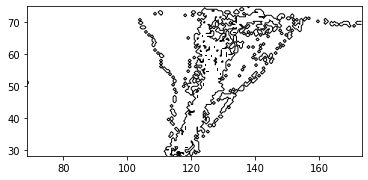

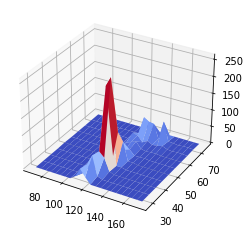

In [8]:
tr.plot_contour(dataframe, filled=False, quiver=False, bins=100)
tr.plot_surface(dataframe)

read data in from (downsampled) file

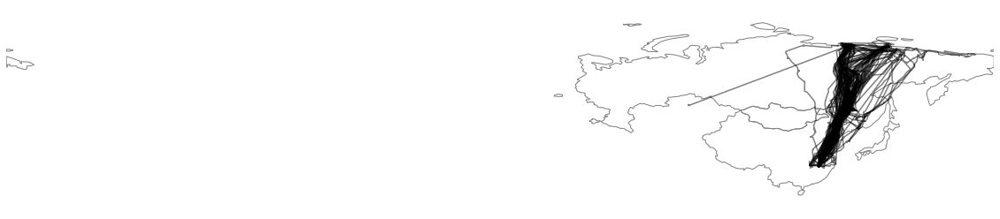

In [9]:
from shapely.geometry import MultiLineString, LineString
longitudes = []
latitudes = []
linestrings = []
trajectories = pd.read_csv('t2vec-master/experiment/combined_exp2_r0-resampled_30downsampled.csv')  
latitudes = trajectories.latitudes
longitudes = trajectories.longitudes
long_float = []
lat_float = []
for r in longitudes:
    r = r[1:len(r)-1]
    long_float.append([float(v) for v in r.split(',')])
    
for r in latitudes:
    r = r[1:len(r)-1]
    lat_float.append([float(v) for v in r.split(',')]) 
    
counter = 0
for lat,long in zip(lat_float, long_float):
    linestrings.append(list(zip(long,lat)))
    counter = counter + 1
line1 = MultiLineString(linestrings)
line_gdf = geopandas.GeoDataFrame(geometry=[line1])
ax = line_gdf.plot(figsize=(20, 15), alpha=0.5, edgecolor='k')
fig = geoplot.polyplot(asia, edgecolor='gray', ax=ax).get_figure()
figure_name = "all_80_trajectories_resampled_30downsampled.png"
fig.savefig(figure_name)

Clustering algorithm

In [10]:
NUM_OF_TRAJECTORIES = 80
MIN_LEN_OF_TRAJECTORY = 10
MAX_LEN_OF_TRAJECTORY = 10000

THRESHOLD = 2.0


In [11]:

trajectoriesSet = {}
i = 1
for item in linestrings:
    print(len(item))
    length = len(item)
    tempTrajectory = item
    
    trajectoriesSet[(str(i),)] = [item]
    i = i +1


976
953
321
930
864
1025
855
573
575
574
601
941
917
487
544
5255
5956
3204
2
2000
4870
46
627
1894
3
14
101
2489
951
826
785
32
35
223
833
790
32
1612
4376
4765
815
1010
1626
209
3422
1661
248
1682
2542
4461
1104
746
4657
706
960
131
3639
850
2961
1086
3314
2473
4476
2906
330
13
828
704
1327
1350
4155
3599
72
4288
364
852
3436
653
807
992


In [12]:
trajectories = deepcopy(trajectoriesSet)
distanceMatrixDictionary = {}
print(len(trajectories))
iteration = 1
while True:
    distanceMatrix = np.empty((len(trajectories), len(trajectories),))
    distanceMatrix[:] = np.nan
    
    for index1, (filter1, trajectory1) in enumerate(trajectories.items()):
        tempArray = []
        
        for index2, (filter2, trajectory2) in enumerate(trajectories.items()):
            
            if index1 > index2:
                continue
            
            elif index1 == index2:
                continue
            
            else:
                unionFilter = filter1 + filter2
                sorted(unionFilter)
                
                if unionFilter in distanceMatrixDictionary.keys():
                    distanceMatrix[index1][index2] = distanceMatrixDictionary.get(unionFilter)
                    
                    continue
                
                metric = []
                for subItem1 in trajectory1:
                    
                    for subItem2 in trajectory2:
                        metric.append(tdist.sspd(np.array(subItem1),np.array(subItem2),type_d="euclidean"))
                
                metric = max(metric)
                
                distanceMatrix[index1][index2] = metric
                distanceMatrixDictionary[unionFilter] = metric
    
    minValue = np.min(list(distanceMatrixDictionary.values()))
    
    if minValue > THRESHOLD:
        break
    
    minIndices = np.where(distanceMatrix == minValue)
    minIndices = list(zip(minIndices[0], minIndices[1]))
    
    minIndex = minIndices[0]
    
    filter1 = list(trajectories.keys())[minIndex[0]]
    filter2 = list(trajectories.keys())[minIndex[1]]
    
    trajectory1 = trajectories.get(filter1)
    trajectory2 = trajectories.get(filter2)
    
    unionFilter = filter1 + filter2
    sorted(unionFilter)
    
    trajectoryGroup = trajectory1 + trajectory2
    
    trajectories = {key: value for key, value in trajectories.items()
                    if all(value not in unionFilter for value in key)}
    
    distanceMatrixDictionary = {key: value for key, value in distanceMatrixDictionary.items()
                                if all(value not in unionFilter for value in key)}
    
    trajectories[unionFilter] = trajectoryGroup
    
    print(iteration, 'finished!')
    iteration += 1
    
    if len(list(trajectories.keys())) == 1:
        break

80
1 finished!
2 finished!
3 finished!
4 finished!
5 finished!
6 finished!
7 finished!
8 finished!
9 finished!
10 finished!
11 finished!
12 finished!
13 finished!
14 finished!
15 finished!
16 finished!
17 finished!
18 finished!
19 finished!
20 finished!
21 finished!
22 finished!
23 finished!
24 finished!
25 finished!
26 finished!
27 finished!
28 finished!
29 finished!
30 finished!
31 finished!
32 finished!
33 finished!
34 finished!
35 finished!
36 finished!
37 finished!
38 finished!
39 finished!
40 finished!
41 finished!
42 finished!
43 finished!
44 finished!
45 finished!
46 finished!
47 finished!
48 finished!
49 finished!
50 finished!
51 finished!
52 finished!
53 finished!
54 finished!
55 finished!
56 finished!
57 finished!
58 finished!
59 finished!
60 finished!
61 finished!
62 finished!
63 finished!
64 finished!
65 finished!
66 finished!
67 finished!
68 finished!
69 finished!
70 finished!
71 finished!
72 finished!
73 finished!


In [13]:
for key, _ in trajectories.items():
    print(key)

('3',)
('7',)
('79', '41', '78', '65', '66', '67', '47', '44', '56', '73', '26', '19', '25', '32', '37', '22', '34', '27', '33')
('24', '74', '64', '45', '62', '18', '71', '13', '50', '6', '1', '53')
('39', '28', '61', '2', '49', '15', '38', '57', '20', '46', '63', '77', '12', '40', '4', '5', '21', '16', '17')
('59', '72', '75')
('9', '76', '80', '14', '23', '43', '70', '11', '8', '54', '58', '68', '29', '35', '10', '52', '36', '55', '30', '42', '48', '60', '31', '51', '69')


In [14]:
for key, value in trajectories.items():
    
    if len(key) == 1:
        print("1")
        continue
    
    figure = make_subplots(rows=1, cols=1)
    colors = ["#"+''.join([random.choice('0123456789ABCDEF') for j in range(6)]) for i in range(len(value))]
    
    for index, subValue in enumerate(value):
        
        figure.add_trace(go.Scatter(x=list(range(0, len(subValue))), y=subValue,
                                    mode='lines', marker_color=colors[index], line = dict(width=4), line_shape='spline'), row=1, col=1,
                        )
        
    
    figure.update_layout(showlegend=False, height=600, width=900)
    figure.show()

1
1


Save clusters in csv file

In [15]:
with open('clustered_trj_resampled_30downsampled.csv', 'a+') as f:
    for k,v in trajectories.items():
        f.write("{0}: {1}\n".format(k,", ".join(", ".join(str(j) for j in k) for k in v)))

In [16]:
print(type(trajectories))
for keys, values in trajectories.items():
    print(keys)
print(values[1])

<class 'dict'>
('3',)
('7',)
('79', '41', '78', '65', '66', '67', '47', '44', '56', '73', '26', '19', '25', '32', '37', '22', '34', '27', '33')
('24', '74', '64', '45', '62', '18', '71', '13', '50', '6', '1', '53')
('39', '28', '61', '2', '49', '15', '38', '57', '20', '46', '63', '77', '12', '40', '4', '5', '21', '16', '17')
('59', '72', '75')
('9', '76', '80', '14', '23', '43', '70', '11', '8', '54', '58', '68', '29', '35', '10', '52', '36', '55', '30', '42', '48', '60', '31', '51', '69')
[(116.1038, 29.12642), (116.11991, 29.11781), (116.11548, 29.11533), (116.11539, 29.1154), (116.13042, 29.11641), (116.12744, 29.11806), (116.12758, 29.11806), (116.12737, 29.11796), (116.1274, 29.11815), (116.12749, 29.1179), (116.14349, 29.10978), (116.16431, 29.08898), (116.14677, 29.11186), (116.14661, 29.11198), (116.14663, 29.11197), (116.14671, 29.11211), (116.14808, 29.109990000000003), (116.14662, 29.11422), (116.14663, 29.11415), (116.14632, 29.11402), (116.14668, 29.11424), (116.14639, 29.

Save clusters into a pickle file

In [17]:
import pickle
import os
a_file = open("clustered_trj_resampled_30downsampled.pkl", "wb")

pickle.dump(trajectories, a_file)

a_file.close()